**Neural Style Transfer Model**

In [0]:
#Import libraries required

import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (10,10)
mpl.rcParams['axes.grid'] = False

import pandas as pd
import numpy as np
from PIL import Image
import time
import functools
import tensorflow as tf
import tensorflow.contrib.eager as tfe
import IPython.display

from tensorflow.python.keras.preprocessing import image as keras_image
from tensorflow.python.keras import models 
from tensorflow.python.keras import losses
from tensorflow.python.keras import layers
from tensorflow.python.keras import backend as K


In [0]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [97]:
tf.enable_eager_execution()
print("Eager execution: {}".format(tf.executing_eagerly()))

Eager execution: True


In [4]:
#Loading all required files
from google.colab import files
uploaded = files.upload()

Saving abstract1.jpg to abstract1.jpg
Saving abstract2.jpg to abstract2.jpg
Saving abstract3.jpg to abstract3.jpg
Saving abstract4.jpg to abstract4.jpg
Saving abstract5.jpg to abstract5.jpg
Saving abstract6.jpg to abstract6.jpg
Saving abstract7.jpg to abstract7.jpg
Saving chicago.jpg to chicago.jpg
Saving chicago_skyline_night.jpg to chicago_skyline_night.jpg
Saving content1.jpg to content1.jpg
Saving content2.jpg to content2.jpg
Saving content3.jpg to content3.jpg
Saving content4.jpg to content4.jpg
Saving content5.jpg to content5.jpg
Saving content6.png to content6.png
Saving content7.jpg to content7.jpg
Saving content8.jpg to content8.jpg
Saving content9.jpg to content9.jpg
Saving content10.jpg to content10.jpg
Saving content11.jpg to content11.jpg
Saving content12.jpg to content12.jpg
Saving image_4286.jpeg to image_4286.jpeg
Saving mona_lisa.jpg to mona_lisa.jpg
Saving monalisa.jpg to monalisa.jpg
Saving output112.jpg to output112.jpg
Saving rain_princess.jpg to rain_princess.jpg


In [0]:
#Data/Image Manipulation Functions

def image_loading(img_name):
  max_dim = 512
  img = Image.open(img_name)
  img_len = max(img.size)
  scale = max_dim/img_len
  img = img.resize((round(img.size[0]*scale), round(img.size[1]*scale)), Image.ANTIALIAS)
  img = keras_image.img_to_array(img)
  img = np.expand_dims(img, axis=0)
  return img

def image_preprocessing(img_name):
  img = image_loading(img_name)
  img = tf.keras.applications.vgg19.preprocess_input(img)
  return img

def image_output(img_mod):
  x = img_mod.copy()
  x = np.squeeze(x, 0)
  x[:, :, 0] += 103.939
  x[:, :, 1] += 116.779
  x[:, :, 2] += 123.68
  x = x[:, :, ::-1]
  x = np.clip(x, 0, 255).astype('uint8')
  return x

def image_display(img, title=None):
  img_out = np.squeeze(img, axis=0)
  img_out = img_out.astype('uint8')
  plt.imshow(img_out)
  if title is not None:
    plt.title(title)
  plt.imshow(img_out)

In [0]:
#Content and Style Feature extraction functions

content_layers = ['block4_conv2', 'block5_conv2'] 
style_layers = ['block1_conv1','block2_conv1','block3_conv1', 'block4_conv1', 'block5_conv1']

n_content = len(content_layers)
n_style = len(style_layers)

def loading_encoder_model():
  vgg_model = tf.keras.applications.vgg19.VGG19(include_top=False, weights='imagenet')
  vgg_model.trainable = False
  style_layer_out = [vgg_model.get_layer(i).output for i in style_layers]
  content_layer_out = [vgg_model.get_layer(i).output for i in content_layers]
  style_and_content = style_layer_out + content_layer_out
  return models.Model(vgg_model.input, style_and_content)

def style_and_content_features(enc_model, content, style): 
  content_op = enc_model(image_preprocessing(content))
  style_op = enc_model(image_preprocessing(style))
  style_features = [style_layer[0] for style_layer in style_op[:n_style]]
  content_features = [content_layer[0] for content_layer in content_op[n_style:]]
  return style_features, content_features

def content_loss_function(base, content_rep):
  return tf.reduce_mean(tf.square(base - content_rep))

def style_gram_matrix(base): 
  c = int(base.shape[-1])
  a = tf.reshape(base, [-1, c])
  n = tf.shape(a)[0]
  gram_mat = tf.matmul(a, a, transpose_a=True)
  return gram_mat / tf.cast(n, tf.float32)

def style_loss_function(base, style_rep):
  height, width, channels = base.get_shape().as_list()
  gram_base = style_gram_matrix(base)
  return tf.reduce_mean(tf.square(gram_base - style_rep))

def total_variation_loss_function(img):
  img_nrows = img.shape[1]
  img_ncols = img.shape[2]
  a = K.square(img[:, :img_nrows - 1, :img_ncols - 1, :] - img[:, 1:, :img_ncols - 1, :])
  b = K.square(img[:, :img_nrows - 1, :img_ncols - 1, :] - img[:, :img_nrows - 1, 1:, :])
  return K.sum(K.pow(a + b, 1.25))

def total_loss_computation(enc_model, loss_weights, base_image, style_features, content_features):
  style_weight, content_weight, variation_weight = loss_weights
  style_and_content_outputs = enc_model(base_image)
  
  style_output_features = style_and_content_outputs[:n_style]
  content_output_features = style_and_content_outputs[n_style:]
  
  style_loss = 0
  content_loss = 0
  wt_per_style = 1.0 / float(n_style)
  for target_style, base_style in zip(style_features, style_output_features):
    style_loss += wt_per_style * style_loss_function(base_style[0], target_style) 
  wt_per_content = 1.0 / float(n_content)
  for target_content, base_content in zip(content_features, content_output_features):
    content_loss += wt_per_content* content_loss_function(base_content[0], target_content)
  
  style_loss = style_loss * style_weight
  content_loss = content_loss * content_weight

  total_loss = style_loss + content_loss + (variation_weight * total_variation_loss_function(base_image))
  return total_loss, style_loss, content_loss


In [0]:
#Optimization functions and displaying final results

def st_gradient_function(args):
  with tf.GradientTape() as tp: 
    loss = total_loss_computation(**args)
  total_loss = loss[0]
  return tp.gradient(total_loss, args['base_image']), loss


def style_transfer_optimization(content_img,style_img,max_epochs=1200,content_weight=7.5e0,style_weight=1e-2, variation_weight=1e-4):  
  enc_model = loading_encoder_model() 
  for layer in enc_model.layers:
    layer.trainable = False
   
  style_features, content_features = style_and_content_features(enc_model, content_img, style_img)
  gram_style_features = [style_gram_matrix(style_feature) for style_feature in style_features]
  
  base_image = image_preprocessing(content_img)
  base_image = tfe.Variable(base_image, dtype=tf.float32)

  opt_st = tf.train.AdamOptimizer(learning_rate=2.5, beta1=0.99, epsilon=1e-1)
  min_loss, op_img = float('inf'), None
  loss_weights = (style_weight, content_weight, variation_weight)
  args = {
      'enc_model': enc_model,
      'loss_weights': loss_weights,
      'base_image': base_image,
      'style_features': gram_style_features,
      'content_features': content_features
  }
    
  num_rows = 3
  num_cols = 5
  display = max_epochs/(num_rows*num_cols)
  
  normalize_means = np.array([103.939, 116.779, 123.68])
  min_vals = -normalize_means
  max_vals = 255 - normalize_means   
  
  imgs_iter = []
  epochs_iter=[]
  for epoch in range(max_epochs):
    gradient, loss = st_gradient_function(args)
    total_loss, style_loss, content_loss = loss
    opt_st.apply_gradients([(gradient, base_image)])
    clipped_img = tf.clip_by_value(base_image, min_vals, max_vals)
    base_image.assign(clipped_img)
    
    if total_loss < min_loss:
      min_loss = total_loss
      op_img = image_output(base_image.numpy())

    if epoch % display == 0:
      disp_img = base_image.numpy()
      disp_img = image_output(disp_img)
      imgs_iter.append(disp_img)
      epochs_iter.append(epoch)

      print('Iteration: {}'.format(epoch))        
      print('Total loss: {:.4e}, ' 
            'style loss: {:.4e}, '
            'content loss: {:.4e}'.format(total_loss, style_loss, content_loss))
  
  plt.figure(figsize=(14,4))
  for i,img in enumerate(imgs_iter):
      plt.subplot(num_rows,num_cols,i+1)
      plt.imshow(img)
      plt.xticks([])
      plt.yticks([])
      plt.title("Iteration : " + str(epochs_iter[i]))
      
  return op_img, min_loss


def display_final_results(op_img, min_loss, content_img, style_img):
  plt.figure(figsize=(10, 5))
  content = image_loading(content_img) 
  style = image_loading(style_img)

  plt.subplot(1, 2, 1)
  image_display(content,'Content Image')

  plt.subplot(1, 2, 2)
  image_display(style,'Style Image')

  plt.figure(figsize=(10, 10))
  plt.imshow(op_img)
  plt.title('Output Image')
  plt.show()
  print("Total Loss:", min_loss)

**Testing Neural Style Transfer using sample content and style images**

Iteration: 0
Total loss: 5.7400e+08, style loss: 5.7392e+08, content loss: 0.0000e+00
Iteration: 80
Total loss: 1.4072e+07, style loss: 1.0899e+07, content loss: 2.0443e+06
Iteration: 160
Total loss: 8.0394e+06, style loss: 4.5589e+06, content loss: 2.1726e+06
Iteration: 240
Total loss: 5.7137e+06, style loss: 2.3585e+06, content loss: 2.1926e+06
Iteration: 320
Total loss: 4.5280e+06, style loss: 1.3965e+06, content loss: 2.1757e+06
Iteration: 400
Total loss: 3.8803e+06, style loss: 9.6942e+05, content loss: 2.1277e+06
Iteration: 480
Total loss: 3.4908e+06, style loss: 7.5865e+05, content loss: 2.0725e+06
Iteration: 560
Total loss: 3.2347e+06, style loss: 6.4279e+05, content loss: 2.0169e+06
Iteration: 640
Total loss: 3.0564e+06, style loss: 5.6983e+05, content loss: 1.9699e+06
Iteration: 720
Total loss: 2.9276e+06, style loss: 5.2160e+05, content loss: 1.9301e+06
Iteration: 800
Total loss: 2.8303e+06, style loss: 4.8717e+05, content loss: 1.8974e+06
Iteration: 880
Total loss: 2.7537e+

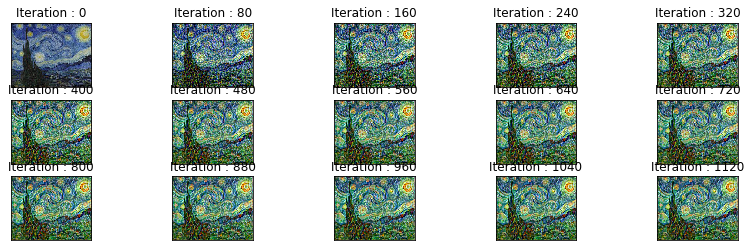

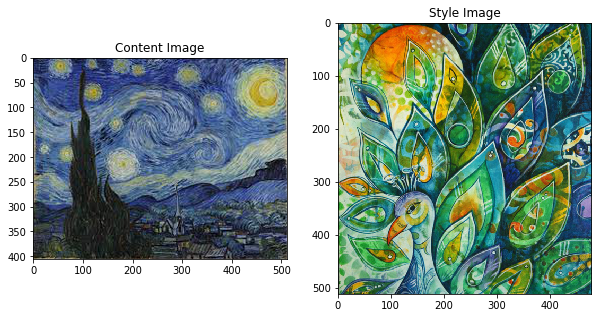

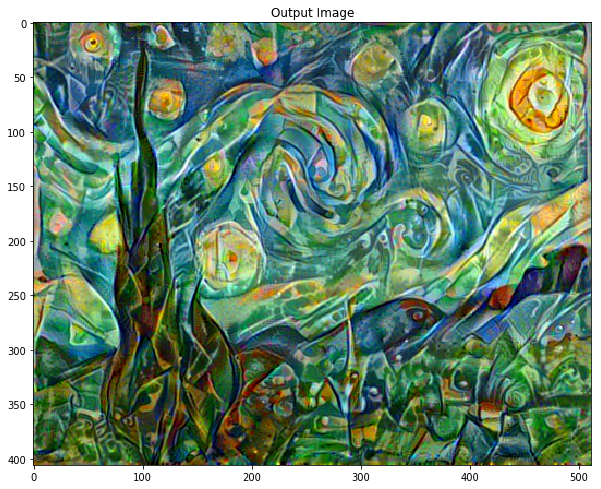

Total Loss: tf.Tensor(2558199.5, shape=(), dtype=float32)


In [17]:
#Image 1 trial 1 - Starry Night Van Gogh

op_img1, min_loss1 = style_transfer_optimization('content8.jpg','abstract3.jpg')
display_final_results(op_img1, min_loss1, 'content8.jpg','abstract3.jpg')

Iteration: 0
Total loss: 4.6970e+08, style loss: 4.6962e+08, content loss: 0.0000e+00
Iteration: 80
Total loss: 1.5052e+07, style loss: 1.1957e+07, content loss: 1.9610e+06
Iteration: 160
Total loss: 7.7993e+06, style loss: 4.5791e+06, content loss: 2.0454e+06
Iteration: 240
Total loss: 5.2482e+06, style loss: 2.2278e+06, content loss: 2.0393e+06
Iteration: 320
Total loss: 4.1005e+06, style loss: 1.3327e+06, content loss: 1.9858e+06
Iteration: 400
Total loss: 3.4784e+06, style loss: 9.4416e+05, content loss: 1.9093e+06
Iteration: 480
Total loss: 3.0955e+06, style loss: 7.5360e+05, content loss: 1.8303e+06
Iteration: 560
Total loss: 2.8410e+06, style loss: 6.4822e+05, content loss: 1.7609e+06
Iteration: 640
Total loss: 2.6645e+06, style loss: 5.7986e+05, content loss: 1.7074e+06
Iteration: 720
Total loss: 2.5364e+06, style loss: 5.3298e+05, content loss: 1.6647e+06
Iteration: 800
Total loss: 2.4398e+06, style loss: 4.9784e+05, content loss: 1.6314e+06
Iteration: 880
Total loss: 2.3644e+

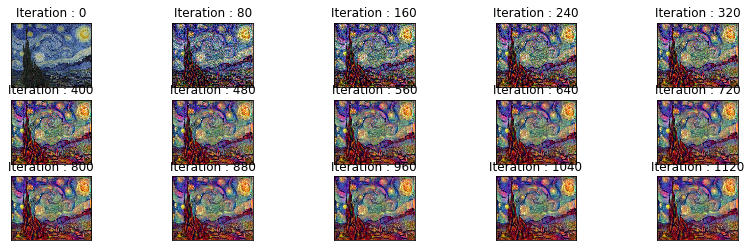

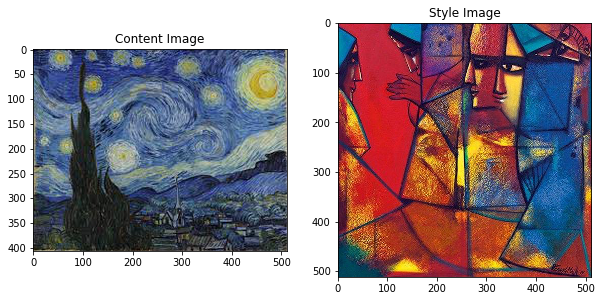

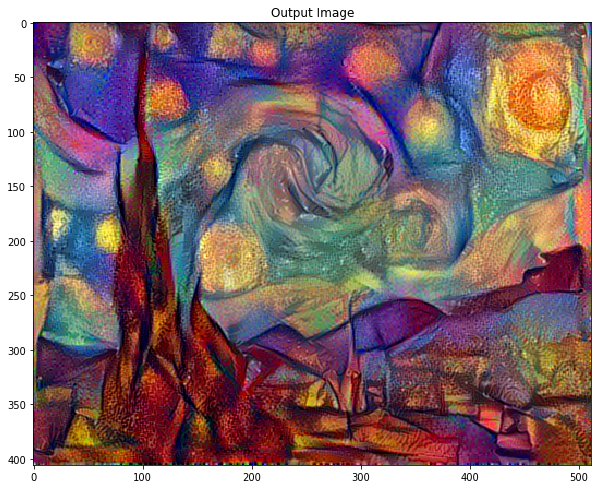

Total Loss: tf.Tensor(2172000.5, shape=(), dtype=float32)


In [18]:
#Image 1 trial 2 - Starry Night Van Gogh

op_img12, min_loss12 = style_transfer_optimization('content8.jpg', 'content10.jpg')
display_final_results(op_img12, min_loss12, 'content8.jpg', 'content10.jpg')

Iteration: 0
Total loss: 3.5213e+08, style loss: 3.5205e+08, content loss: 0.0000e+00
Iteration: 80
Total loss: 1.2250e+07, style loss: 9.4654e+06, content loss: 1.9825e+06
Iteration: 160
Total loss: 6.5810e+06, style loss: 3.6603e+06, content loss: 2.0670e+06
Iteration: 240
Total loss: 4.5046e+06, style loss: 1.7517e+06, content loss: 2.0392e+06
Iteration: 320
Total loss: 3.5637e+06, style loss: 1.0265e+06, content loss: 1.9725e+06
Iteration: 400
Total loss: 3.0609e+06, style loss: 7.2589e+05, content loss: 1.8851e+06
Iteration: 480
Total loss: 2.7537e+06, style loss: 5.8027e+05, content loss: 1.8047e+06
Iteration: 560
Total loss: 2.5524e+06, style loss: 5.0268e+05, content loss: 1.7363e+06
Iteration: 640
Total loss: 2.4139e+06, style loss: 4.5349e+05, content loss: 1.6842e+06
Iteration: 720
Total loss: 2.3141e+06, style loss: 4.2042e+05, content loss: 1.6433e+06
Iteration: 800
Total loss: 2.2388e+06, style loss: 3.9662e+05, content loss: 1.6103e+06
Iteration: 880
Total loss: 2.1799e+

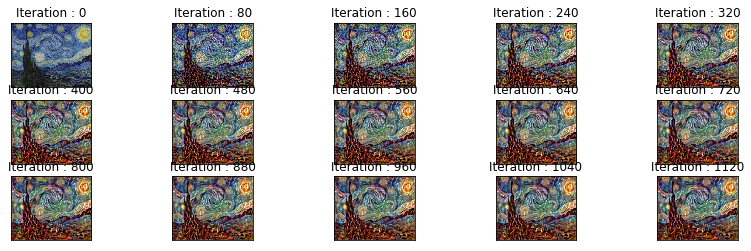

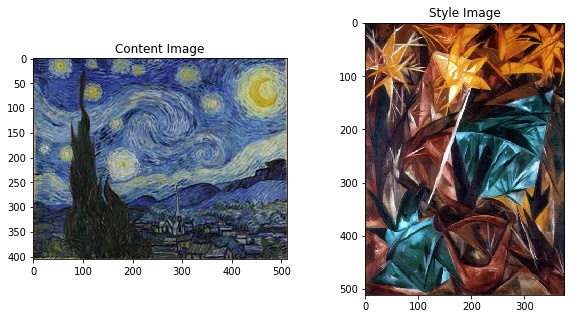

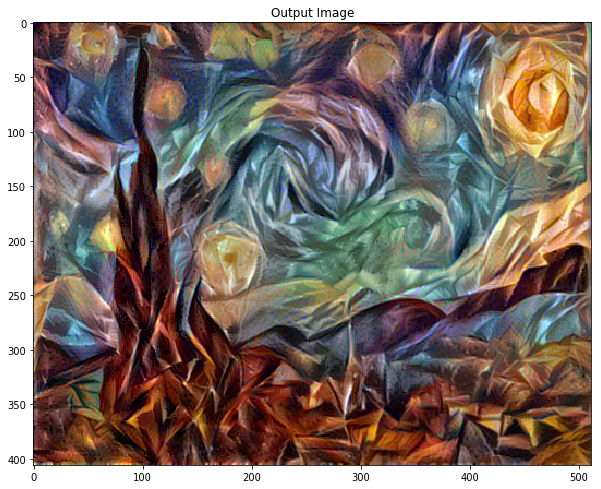

Total Loss: tf.Tensor(2031072.6, shape=(), dtype=float32)


In [19]:
#Image 1 trial 3 - Starry Night Van Gogh

op_img13, min_loss13 = style_transfer_optimization('content8.jpg', 'content12.jpg')
display_final_results(op_img13, min_loss13, 'content8.jpg', 'content12.jpg')

Iteration: 0
Total loss: 1.8148e+08, style loss: 1.8128e+08, content loss: 0.0000e+00
Iteration: 80
Total loss: 7.9840e+06, style loss: 5.4315e+06, content loss: 1.7843e+06
Iteration: 160
Total loss: 5.2844e+06, style loss: 2.6368e+06, content loss: 1.8115e+06
Iteration: 240
Total loss: 3.9496e+06, style loss: 1.4744e+06, content loss: 1.7718e+06
Iteration: 320
Total loss: 3.2169e+06, style loss: 9.5352e+05, content loss: 1.7041e+06
Iteration: 400
Total loss: 2.8038e+06, style loss: 7.1768e+05, content loss: 1.6313e+06
Iteration: 480
Total loss: 2.5509e+06, style loss: 5.9191e+05, content loss: 1.5713e+06
Iteration: 560
Total loss: 2.3868e+06, style loss: 5.1673e+05, content loss: 1.5249e+06
Iteration: 640
Total loss: 2.2742e+06, style loss: 4.6829e+05, content loss: 1.4890e+06
Iteration: 720
Total loss: 2.1947e+06, style loss: 4.3689e+05, content loss: 1.4607e+06
Iteration: 800
Total loss: 2.1358e+06, style loss: 4.1367e+05, content loss: 1.4396e+06
Iteration: 880
Total loss: 2.0899e+

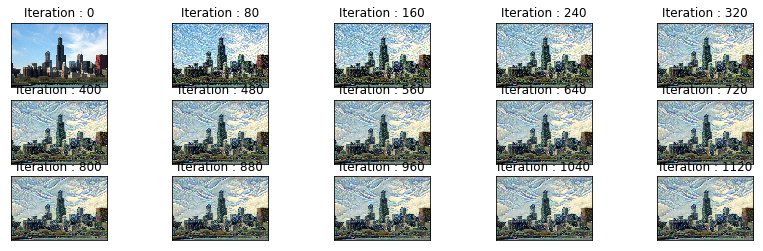

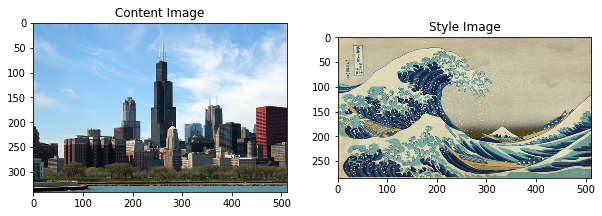

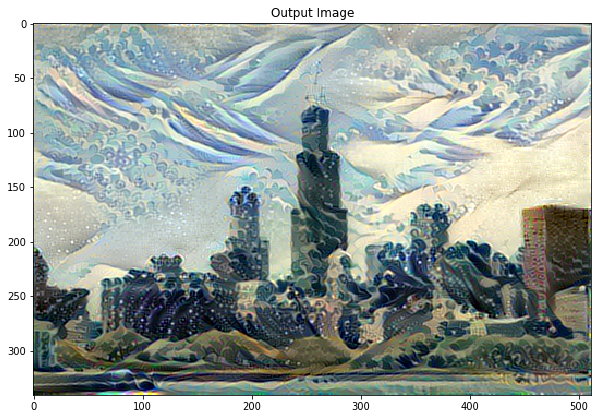

Total Loss: tf.Tensor(1975575.4, shape=(), dtype=float32)


In [20]:
#Image 2 trial 1 - Chicago Daylight

op_img2, min_loss2 = style_transfer_optimization('chicago.jpg','wave.jpg')
display_final_results(op_img2, min_loss2,  'chicago.jpg','wave.jpg')

Iteration: 0
Total loss: 8.7980e+08, style loss: 8.7960e+08, content loss: 0.0000e+00
Iteration: 80
Total loss: 2.2412e+07, style loss: 1.8691e+07, content loss: 2.8147e+06
Iteration: 160
Total loss: 1.1715e+07, style loss: 7.6883e+06, content loss: 2.9142e+06
Iteration: 240
Total loss: 8.1395e+06, style loss: 4.0894e+06, content loss: 2.9642e+06
Iteration: 320
Total loss: 6.4545e+06, style loss: 2.5173e+06, content loss: 2.9589e+06
Iteration: 400
Total loss: 5.5162e+06, style loss: 1.7479e+06, content loss: 2.9117e+06
Iteration: 480
Total loss: 4.9329e+06, style loss: 1.3383e+06, content loss: 2.8454e+06
Iteration: 560
Total loss: 4.5475e+06, style loss: 1.1079e+06, content loss: 2.7774e+06
Iteration: 640
Total loss: 4.2792e+06, style loss: 9.6679e+05, content loss: 2.7178e+06
Iteration: 720
Total loss: 4.0816e+06, style loss: 8.7507e+05, content loss: 2.6640e+06
Iteration: 800
Total loss: 3.9307e+06, style loss: 8.0964e+05, content loss: 2.6190e+06
Iteration: 880
Total loss: 3.8108e+

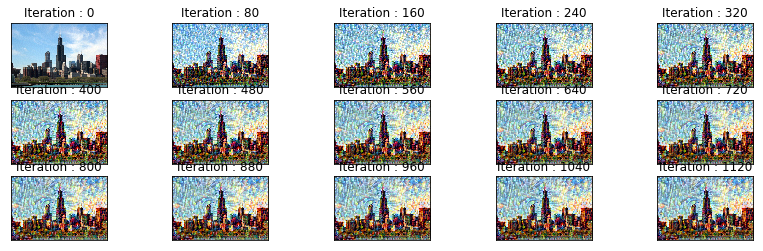

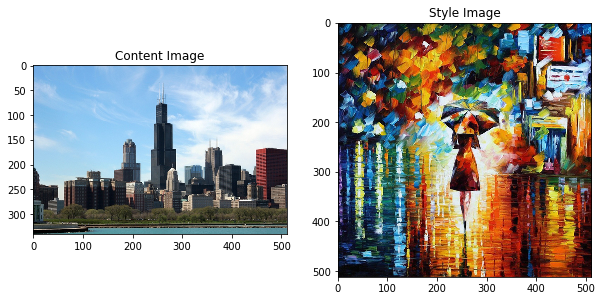

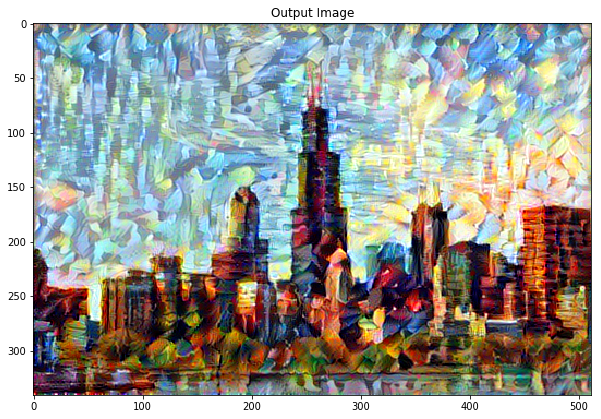

Total Loss: tf.Tensor(3502604.0, shape=(), dtype=float32)


In [21]:
#Image 2 trial 2 - Chicago Daylight

op_img22, min_loss22 = style_transfer_optimization('chicago.jpg','rain_princess.jpg')
display_final_results(op_img22, min_loss22,  'chicago.jpg','rain_princess.jpg')

Iteration: 0
Total loss: 1.0562e+08, style loss: 1.0542e+08, content loss: 0.0000e+00
Iteration: 80
Total loss: 6.9225e+06, style loss: 4.9806e+06, content loss: 1.5609e+06
Iteration: 160
Total loss: 4.0390e+06, style loss: 2.0838e+06, content loss: 1.5846e+06
Iteration: 240
Total loss: 2.9606e+06, style loss: 1.1242e+06, content loss: 1.5295e+06
Iteration: 320
Total loss: 2.4310e+06, style loss: 7.3951e+05, content loss: 1.4444e+06
Iteration: 400
Total loss: 2.1288e+06, style loss: 5.6246e+05, content loss: 1.3645e+06
Iteration: 480
Total loss: 1.9463e+06, style loss: 4.7010e+05, content loss: 1.3044e+06
Iteration: 560
Total loss: 1.8282e+06, style loss: 4.1643e+05, content loss: 1.2596e+06
Iteration: 640
Total loss: 1.7475e+06, style loss: 3.8271e+05, content loss: 1.2259e+06
Iteration: 720
Total loss: 1.6897e+06, style loss: 3.5953e+05, content loss: 1.2005e+06
Iteration: 800
Total loss: 1.6470e+06, style loss: 3.4295e+05, content loss: 1.1808e+06
Iteration: 880
Total loss: 1.6143e+

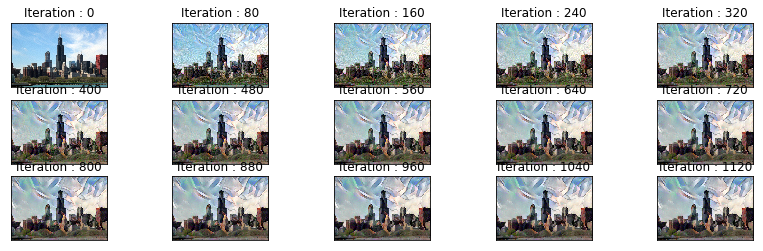

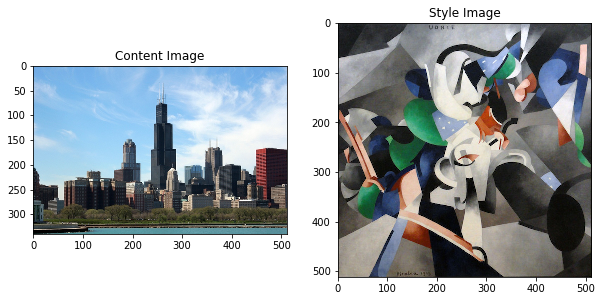

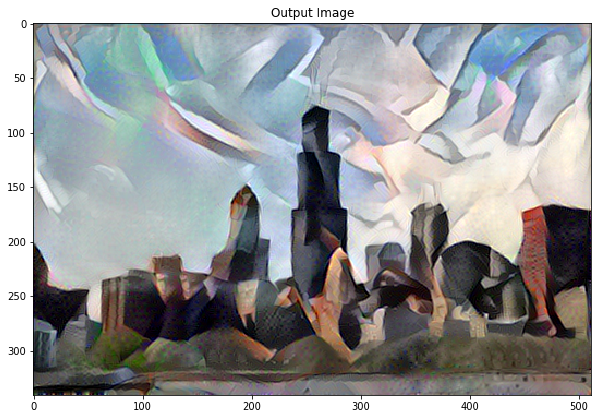

Total Loss: tf.Tensor(1532634.5, shape=(), dtype=float32)


In [22]:
#Image 2 trial 3 - Chicago Daylight

op_img23, min_loss23 = style_transfer_optimization('chicago.jpg','udnie.jpg')
display_final_results(op_img23, min_loss23,  'chicago.jpg','udnie.jpg')

Iteration: 0
Total loss: 7.8066e+08, style loss: 7.8061e+08, content loss: 0.0000e+00
Iteration: 80
Total loss: 4.9749e+07, style loss: 4.6870e+07, content loss: 2.3193e+06
Iteration: 160
Total loss: 2.3111e+07, style loss: 2.0096e+07, content loss: 2.3767e+06
Iteration: 240
Total loss: 1.3306e+07, style loss: 1.0284e+07, content loss: 2.4123e+06
Iteration: 320
Total loss: 9.0002e+06, style loss: 6.0218e+06, content loss: 2.4254e+06
Iteration: 400
Total loss: 6.8463e+06, style loss: 3.9303e+06, content loss: 2.4238e+06
Iteration: 480
Total loss: 5.6781e+06, style loss: 2.8287e+06, content loss: 2.4126e+06
Iteration: 560
Total loss: 4.9844e+06, style loss: 2.2018e+06, content loss: 2.3938e+06
Iteration: 640
Total loss: 4.5350e+06, style loss: 1.8104e+06, content loss: 2.3757e+06
Iteration: 720
Total loss: 4.2236e+06, style loss: 1.5529e+06, content loss: 2.3548e+06
Iteration: 800
Total loss: 3.9942e+06, style loss: 1.3686e+06, content loss: 2.3364e+06
Iteration: 880
Total loss: 3.8175e+

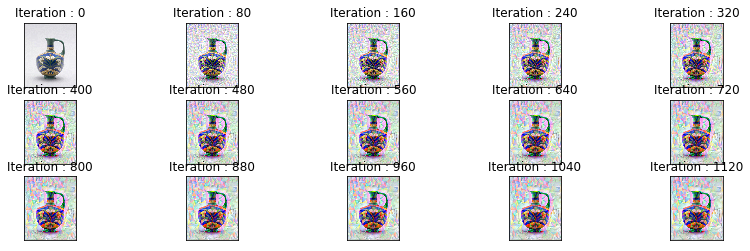

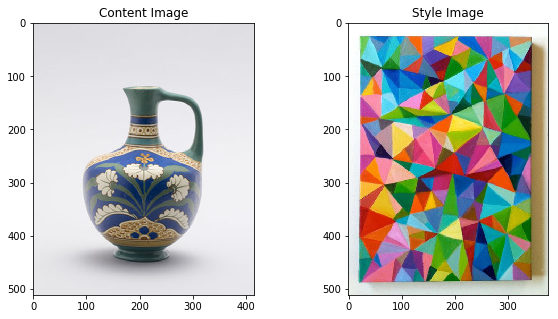

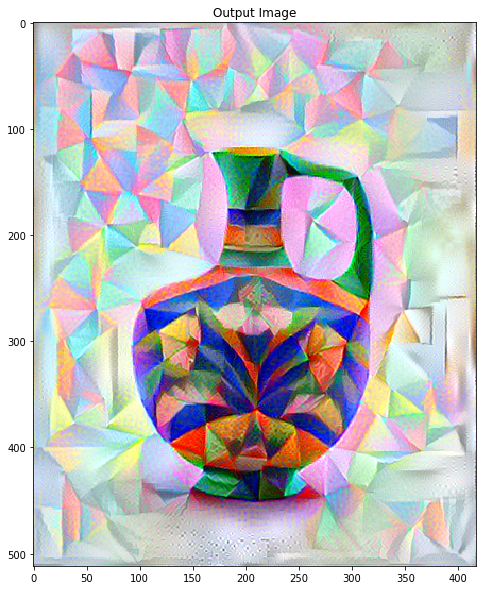

Total Loss: tf.Tensor(3378208.8, shape=(), dtype=float32)


In [23]:
#Image 3 trial 1 - Vase

op_img3, min_loss3 = style_transfer_optimization('content5.jpg', 'abstract5.jpg')
display_final_results(op_img3, min_loss3,  'content5.jpg','abstract5.jpg')


Iteration: 0
Total loss: 5.3689e+09, style loss: 5.3688e+09, content loss: 0.0000e+00
Iteration: 80
Total loss: 1.1886e+08, style loss: 1.1163e+08, content loss: 4.9801e+06
Iteration: 160
Total loss: 5.0196e+07, style loss: 4.1584e+07, content loss: 5.0841e+06
Iteration: 240
Total loss: 3.0111e+07, style loss: 2.1125e+07, content loss: 5.1053e+06
Iteration: 320
Total loss: 2.1875e+07, style loss: 1.2817e+07, content loss: 5.2289e+06
Iteration: 400
Total loss: 1.7699e+07, style loss: 8.8577e+06, content loss: 5.2355e+06
Iteration: 480
Total loss: 1.5016e+07, style loss: 6.4244e+06, content loss: 5.2612e+06
Iteration: 560
Total loss: 1.3339e+07, style loss: 5.0006e+06, content loss: 5.2673e+06
Iteration: 640
Total loss: 1.2167e+07, style loss: 4.0656e+06, content loss: 5.2609e+06
Iteration: 720
Total loss: 1.1335e+07, style loss: 3.4448e+06, content loss: 5.2519e+06
Iteration: 800
Total loss: 1.0718e+07, style loss: 3.0093e+06, content loss: 5.2441e+06
Iteration: 880
Total loss: 1.0243e+

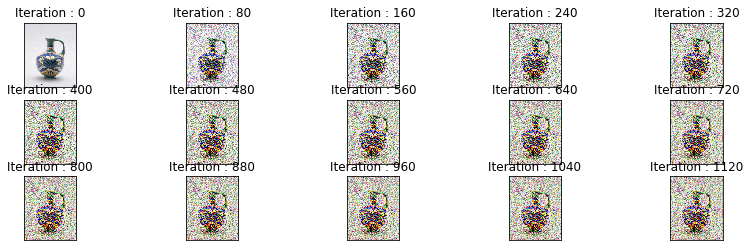

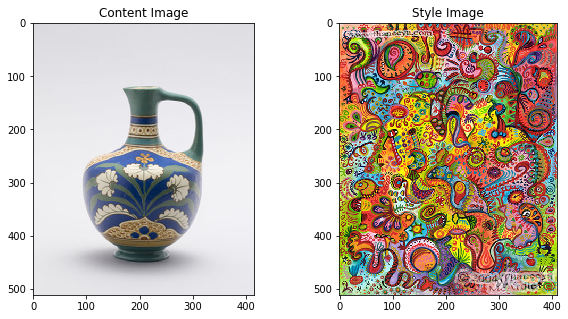

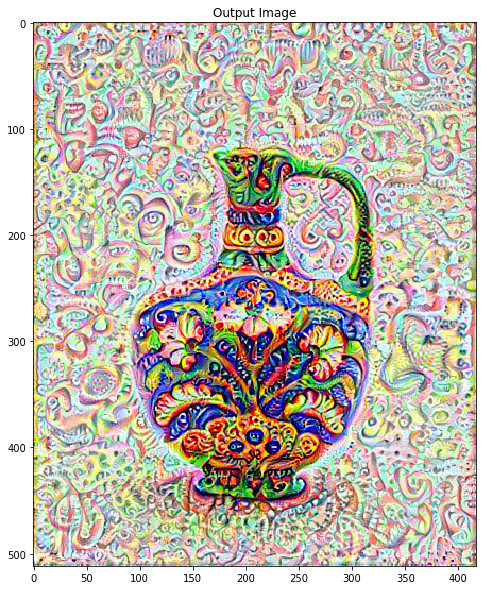

Total Loss: tf.Tensor(9075556.0, shape=(), dtype=float32)


In [24]:
#Image 3 trial 2 - Vase

op_img32, min_loss32 = style_transfer_optimization('content5.jpg','abstract4.jpg')
display_final_results(op_img32, min_loss32,  'content5.jpg','abstract4.jpg')


Iteration: 0
Total loss: 4.0140e+08, style loss: 4.0135e+08, content loss: 0.0000e+00
Iteration: 80
Total loss: 2.2859e+07, style loss: 2.0130e+07, content loss: 2.0981e+06
Iteration: 160
Total loss: 1.1228e+07, style loss: 8.3205e+06, content loss: 2.1404e+06
Iteration: 240
Total loss: 7.3358e+06, style loss: 4.4666e+06, content loss: 2.1395e+06
Iteration: 320
Total loss: 5.5456e+06, style loss: 2.7937e+06, content loss: 2.1118e+06
Iteration: 400
Total loss: 4.5918e+06, style loss: 1.9603e+06, content loss: 2.0827e+06
Iteration: 480
Total loss: 4.0324e+06, style loss: 1.5118e+06, content loss: 2.0481e+06
Iteration: 560
Total loss: 3.6800e+06, style loss: 1.2517e+06, content loss: 2.0155e+06
Iteration: 640
Total loss: 3.4417e+06, style loss: 1.0886e+06, content loss: 1.9851e+06
Iteration: 720
Total loss: 3.2736e+06, style loss: 9.8034e+05, content loss: 1.9585e+06
Iteration: 800
Total loss: 3.1486e+06, style loss: 9.0189e+05, content loss: 1.9366e+06
Iteration: 880
Total loss: 3.0520e+

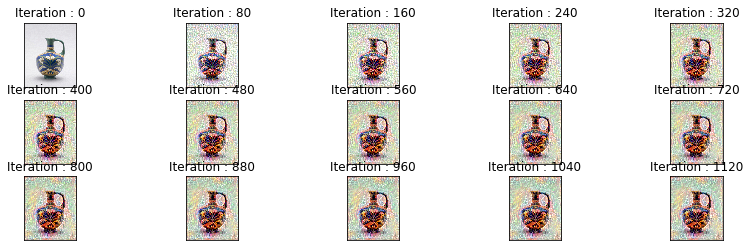

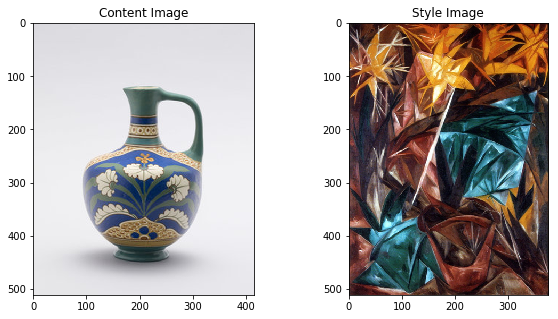

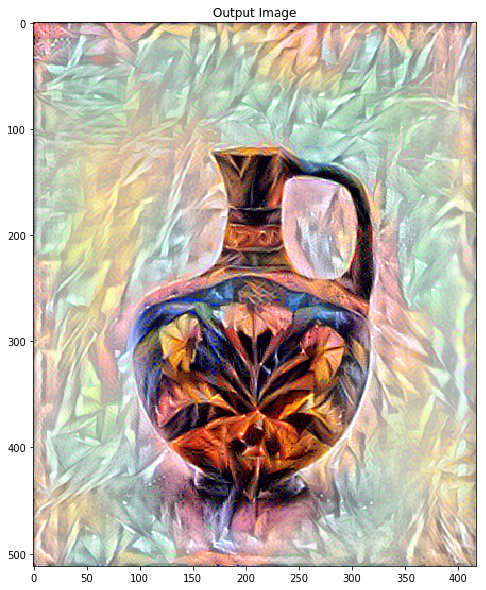

Total Loss: tf.Tensor(2808362.5, shape=(), dtype=float32)


In [25]:
#Image 3 trial 3 - Vase

op_img33, min_loss33 = style_transfer_optimization('content5.jpg', 'content12.jpg')
display_final_results(op_img33, min_loss33, 'content5.jpg','content12.jpg')


Iteration: 0
Total loss: 3.8802e+08, style loss: 3.8746e+08, content loss: 0.0000e+00
Iteration: 80
Total loss: 1.8971e+07, style loss: 1.6024e+07, content loss: 2.3147e+06
Iteration: 160
Total loss: 1.0419e+07, style loss: 7.3019e+06, content loss: 2.4631e+06
Iteration: 240
Total loss: 7.0444e+06, style loss: 3.9836e+06, content loss: 2.4882e+06
Iteration: 320
Total loss: 5.4637e+06, style loss: 2.5513e+06, content loss: 2.4356e+06
Iteration: 400
Total loss: 4.6102e+06, style loss: 1.8531e+06, content loss: 2.3626e+06
Iteration: 480
Total loss: 4.1003e+06, style loss: 1.4878e+06, content loss: 2.2813e+06
Iteration: 560
Total loss: 3.7692e+06, style loss: 1.2779e+06, content loss: 2.2070e+06
Iteration: 640
Total loss: 3.5377e+06, style loss: 1.1437e+06, content loss: 2.1446e+06
Iteration: 720
Total loss: 3.3679e+06, style loss: 1.0459e+06, content loss: 2.0985e+06
Iteration: 800
Total loss: 3.2383e+06, style loss: 9.7386e+05, content loss: 2.0605e+06
Iteration: 880
Total loss: 3.1380e+

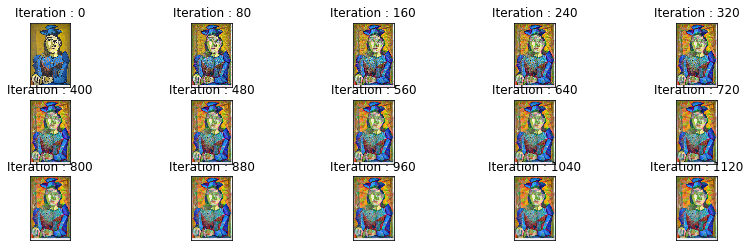

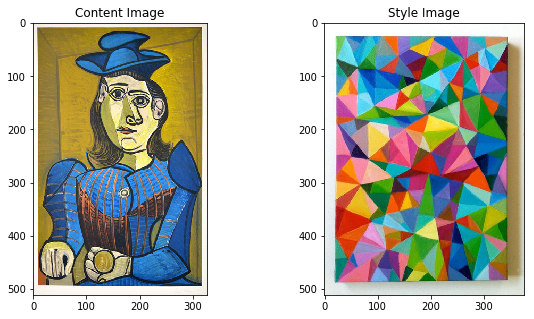

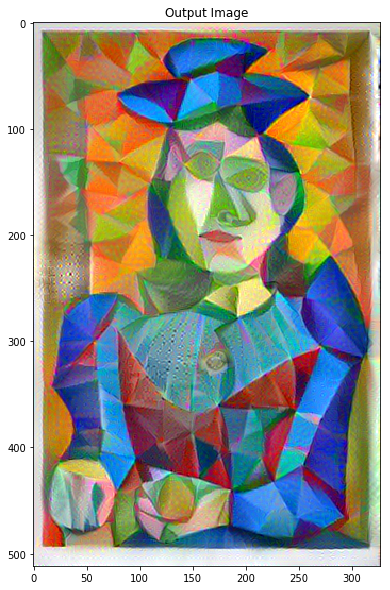

Total Loss: tf.Tensor(2883051.0, shape=(), dtype=float32)


In [26]:
#Image 4 trial 1 - Picasso

op_img4, min_loss4 = style_transfer_optimization('content9.jpg', 'abstract5.jpg')
display_final_results(op_img4, min_loss4, 'content9.jpg','abstract5.jpg')


Iteration: 0
Total loss: 5.9771e+08, style loss: 5.9715e+08, content loss: 0.0000e+00
Iteration: 80
Total loss: 1.6454e+07, style loss: 1.2114e+07, content loss: 3.2324e+06
Iteration: 160
Total loss: 1.0582e+07, style loss: 5.9732e+06, content loss: 3.3756e+06
Iteration: 240
Total loss: 7.7466e+06, style loss: 3.3229e+06, content loss: 3.3011e+06
Iteration: 320
Total loss: 6.2084e+06, style loss: 2.0796e+06, content loss: 3.1678e+06
Iteration: 400
Total loss: 5.3184e+06, style loss: 1.4992e+06, content loss: 3.0063e+06
Iteration: 480
Total loss: 4.7586e+06, style loss: 1.1880e+06, content loss: 2.8738e+06
Iteration: 560
Total loss: 4.3878e+06, style loss: 1.0168e+06, content loss: 2.7608e+06
Iteration: 640
Total loss: 4.1243e+06, style loss: 9.1018e+05, content loss: 2.6677e+06
Iteration: 720
Total loss: 3.9275e+06, style loss: 8.3631e+05, content loss: 2.5930e+06
Iteration: 800
Total loss: 3.7766e+06, style loss: 7.8110e+05, content loss: 2.5346e+06
Iteration: 880
Total loss: 3.6574e+

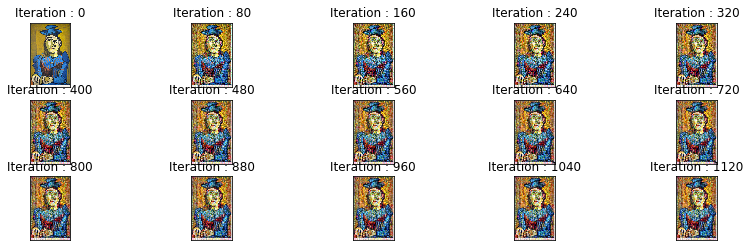

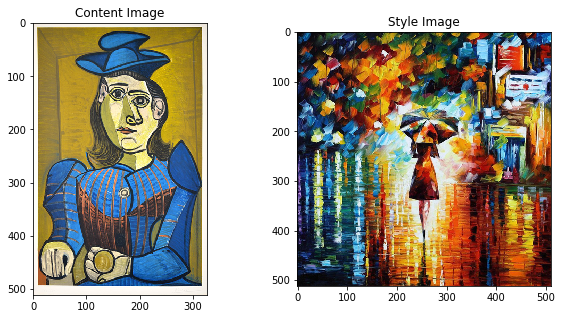

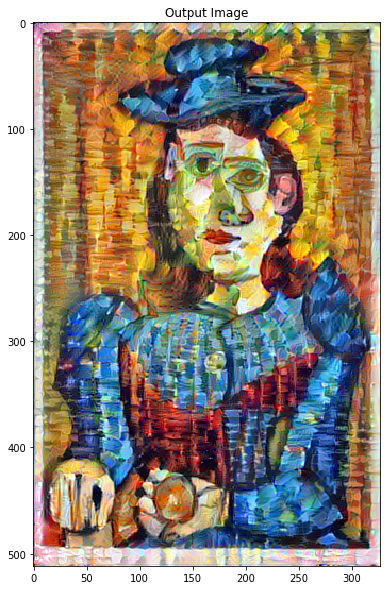

Total Loss: tf.Tensor(3353444.2, shape=(), dtype=float32)


In [27]:
#Image 4 trial 2 - Picasso

op_img42, min_loss42 = style_transfer_optimization('content9.jpg','rain_princess.jpg')
display_final_results(op_img42, min_loss42, 'content9.jpg','rain_princess.jpg')


Iteration: 0
Total loss: 2.6851e+08, style loss: 2.6845e+08, content loss: 0.0000e+00
Iteration: 80
Total loss: 7.7986e+06, style loss: 5.5826e+06, content loss: 1.6016e+06
Iteration: 160
Total loss: 4.7038e+06, style loss: 2.4587e+06, content loss: 1.6294e+06
Iteration: 240
Total loss: 3.4212e+06, style loss: 1.3300e+06, content loss: 1.5935e+06
Iteration: 320
Total loss: 2.7782e+06, style loss: 8.5580e+05, content loss: 1.5298e+06
Iteration: 400
Total loss: 2.4159e+06, style loss: 6.3341e+05, content loss: 1.4668e+06
Iteration: 480
Total loss: 2.1933e+06, style loss: 5.1897e+05, content loss: 1.4113e+06
Iteration: 560
Total loss: 2.0467e+06, style loss: 4.5116e+05, content loss: 1.3677e+06
Iteration: 640
Total loss: 1.9457e+06, style loss: 4.1043e+05, content loss: 1.3312e+06
Iteration: 720
Total loss: 1.8723e+06, style loss: 3.8228e+05, content loss: 1.3025e+06
Iteration: 800
Total loss: 1.8172e+06, style loss: 3.6091e+05, content loss: 1.2811e+06
Iteration: 880
Total loss: 1.7742e+

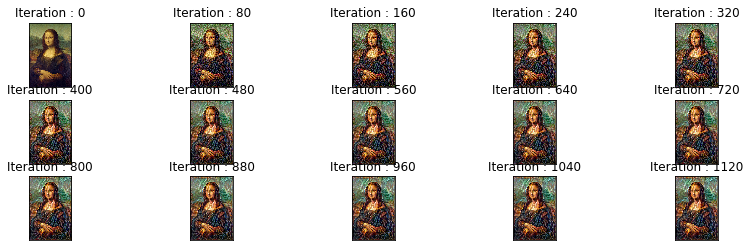

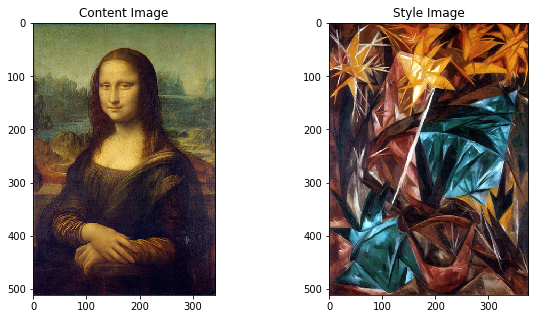

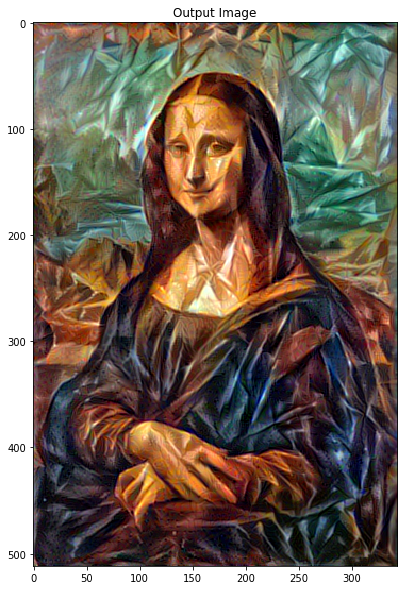

Total Loss: tf.Tensor(1665856.0, shape=(), dtype=float32)


In [28]:
#Image 5 trial 1 - Mona Lisa

op_img5, min_loss5 = style_transfer_optimization('mona_lisa.jpg','content12.jpg')
display_final_results(op_img5, min_loss5, 'mona_lisa.jpg','content12.jpg')

Iteration: 0
Total loss: 3.1678e+08, style loss: 3.1672e+08, content loss: 0.0000e+00
Iteration: 80
Total loss: 9.1405e+06, style loss: 6.8767e+06, content loss: 1.5388e+06
Iteration: 160
Total loss: 5.3754e+06, style loss: 3.0132e+06, content loss: 1.5967e+06
Iteration: 240
Total loss: 3.8604e+06, style loss: 1.6408e+06, content loss: 1.5693e+06
Iteration: 320
Total loss: 3.0989e+06, style loss: 1.0583e+06, content loss: 1.5102e+06
Iteration: 400
Total loss: 2.6661e+06, style loss: 7.8489e+05, content loss: 1.4462e+06
Iteration: 480
Total loss: 2.3954e+06, style loss: 6.4975e+05, content loss: 1.3810e+06
Iteration: 560
Total loss: 2.2170e+06, style loss: 5.7118e+05, content loss: 1.3308e+06
Iteration: 640
Total loss: 2.0919e+06, style loss: 5.1971e+05, content loss: 1.2918e+06
Iteration: 720
Total loss: 2.0001e+06, style loss: 4.8509e+05, content loss: 1.2594e+06
Iteration: 800
Total loss: 1.9300e+06, style loss: 4.5939e+05, content loss: 1.2335e+06
Iteration: 880
Total loss: 1.8742e+

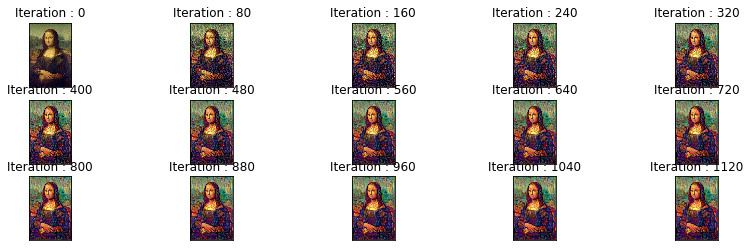

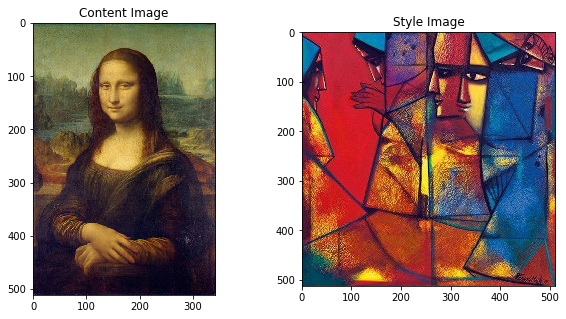

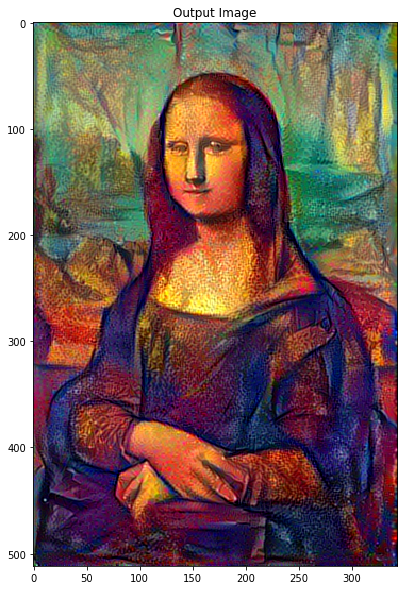

Total Loss: tf.Tensor(1729900.0, shape=(), dtype=float32)


In [29]:
#Image 5 trial 2 - Mona Lisa

op_img52, min_loss52 = style_transfer_optimization('mona_lisa.jpg','content10.jpg')
display_final_results(op_img52, min_loss52, 'mona_lisa.jpg','content10.jpg')


Iteration: 0
Total loss: 2.3115e+08, style loss: 2.3109e+08, content loss: 0.0000e+00
Iteration: 80
Total loss: 9.6644e+06, style loss: 7.1892e+06, content loss: 1.5558e+06
Iteration: 160
Total loss: 6.1592e+06, style loss: 3.5688e+06, content loss: 1.5814e+06
Iteration: 240
Total loss: 4.3347e+06, style loss: 1.9458e+06, content loss: 1.5591e+06
Iteration: 320
Total loss: 3.3901e+06, style loss: 1.2227e+06, content loss: 1.5172e+06
Iteration: 400
Total loss: 2.8800e+06, style loss: 8.8727e+05, content loss: 1.4697e+06
Iteration: 480
Total loss: 2.5770e+06, style loss: 7.1310e+05, content loss: 1.4244e+06
Iteration: 560
Total loss: 2.3833e+06, style loss: 6.1201e+05, content loss: 1.3856e+06
Iteration: 640
Total loss: 2.2516e+06, style loss: 5.4521e+05, content loss: 1.3564e+06
Iteration: 720
Total loss: 2.1576e+06, style loss: 5.0082e+05, content loss: 1.3318e+06
Iteration: 800
Total loss: 2.0881e+06, style loss: 4.6807e+05, content loss: 1.3130e+06
Iteration: 880
Total loss: 2.0345e+

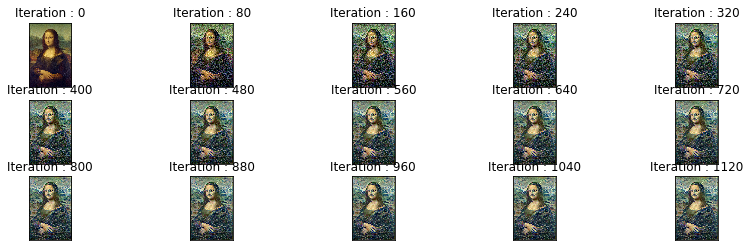

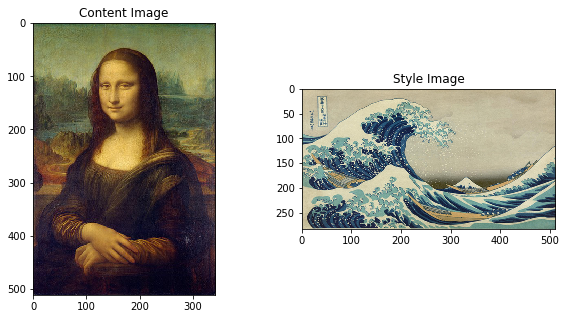

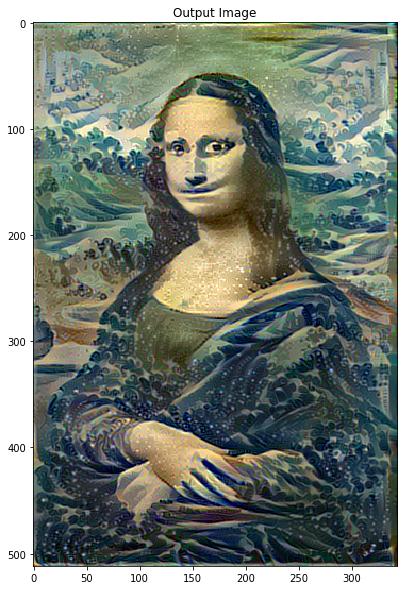

Total Loss: tf.Tensor(1903023.8, shape=(), dtype=float32)


In [30]:
#Image 5 trial 3 - Mona Lisa

op_img53, min_loss53 = style_transfer_optimization('mona_lisa.jpg','wave.jpg')
display_final_results(op_img53, min_loss53, 'mona_lisa.jpg','wave.jpg')

**Auto-Styling and Evaluation**

In [31]:
!git clone https://github.com/Netflix/vmaf.git
%cd vmaf/
!make && make install
%cd /content/vmaf/libsvm/python/
!make
import sys
sys.path.append('/content/vmaf/libsvm/python')

Cloning into 'vmaf'...
remote: Enumerating objects: 7, done.
remote: Counting objects: 100% (7/7), done.
remote: Compressing objects: 100% (7/7), done.
remote: Total 9466 (delta 0), reused 3 (delta 0), pack-reused 9459
Receiving objects: 100% (9466/9466), 238.85 MiB | 25.66 MiB/s, done.
Resolving deltas: 100% (6382/6382), done.
/content/vmaf
for dir in ptools libsvm wrapper feature; do \
	cd ${dir}; make; cd ..; \
done
make[1]: Entering directory '/content/vmaf/ptools'
g++ -Wall -Wextra -fpic -O -fno-strict-aliasing -DLINUX_ -DOC_NEW_STYLE_INCLUDES -Wno-deprecated -I./opencontainers_1_8_4/include -pthread -D_REENTRANT -c m2pythontools.cc
In file included from ./opencontainers_1_8_4/include/ocarray.h:27:0,
                 from m2pythontools.h:8,
                 from m2pythontools.cc:2:
./opencontainers_1_8_4/include/ocport.h: In instantiation of ‘std::__cxx11::string OC::StringizeInt(INT) [with INT = short int; std::__cxx11::string = std::__cxx11::basic_string<char>]’:
./opencontainer

In [0]:
import collections
from itertools import chain
import urllib.request as request
import pickle 
import svm, svmutil

import numpy as np

import scipy.signal as signal
import scipy.ndimage.filters as filters
import scipy.special as special
import scipy.optimize as optimize

import matplotlib.pyplot as plt

import skimage.io
import skimage.transform

import cv2
from skimage import measure


In [38]:
#Loading all required files
from google.colab import files
uploaded = files.upload()

Saving abstract1.jpg to abstract1.jpg
Saving abstract2.jpg to abstract2.jpg
Saving abstract3.jpg to abstract3.jpg
Saving abstract4.jpg to abstract4.jpg
Saving abstract5.jpg to abstract5.jpg
Saving abstract6.jpg to abstract6.jpg
Saving abstract7.jpg to abstract7.jpg
Saving chicago.jpg to chicago.jpg
Saving chicago_skyline_night.jpg to chicago_skyline_night.jpg
Saving content1.jpg to content1.jpg
Saving content2.jpg to content2.jpg
Saving content3.jpg to content3.jpg
Saving content4.jpg to content4.jpg
Saving content5.jpg to content5.jpg
Saving content6.png to content6.png
Saving content7.jpg to content7.jpg
Saving content8.jpg to content8.jpg
Saving content9.jpg to content9.jpg
Saving content10.jpg to content10.jpg
Saving content11.jpg to content11.jpg
Saving content12.jpg to content12.jpg
Saving image_4286.jpeg to image_4286.jpeg
Saving mona_lisa.jpg to mona_lisa.jpg
Saving monalisa.jpg to monalisa.jpg
Saving output112.jpg to output112.jpg
Saving rain_princess.jpg to rain_princess.jpg


**Reference based Evaluation Metrics**

In [0]:
output_files = ["chicago_1.png","chicago_2.png","chicago_3.png","starry_night_1.png","starry_night_2.png","starry_night_3.png","vase_1.png","vase_2.png","vase_3.png","picasso_1.png",
                "picasso_2.png","mona_lisa_1.png","mona_lisa_2.png","mona_lisa_3.png"]
input_files = ["chicago.jpg", "chicago.jpg", "chicago.jpg","content8.jpg","content8.jpg","content8.jpg","content5.jpg","content5.jpg","content5.jpg", "content9.jpg","content9.jpg",
              "mona_lisa.jpg","mona_lisa.jpg","mona_lisa.jpg"]

In [0]:
#Functions for reference-based evaluation metrics : MSE and SSIM

def mse_ref_based(imgA, imgB):
	mse = np.sum((imgA.astype("float") - imgB.astype("float")) ** 2)
	mse /= float(imgA.shape[0] * imgA.shape[1])
	return mse

def ssim_ref_based(imgA, imgB):
  s = measure.compare_ssim(imgA, imgB)
  return s

In [39]:
#Run for all output and input files

input_images = []
output_images = []
mse = []
ssim = []

for i in input_files:
  x = cv2.imread(i)
  input_images.append(cv2.resize(cv2.cvtColor(x, cv2.COLOR_BGR2GRAY),(4000,4000)))
  
for i in output_files:
  x = cv2.imread(i)
  output_images.append(cv2.resize(cv2.cvtColor(x, cv2.COLOR_BGR2GRAY),(4000,4000)))

for i in range(len(input_files)):
  mse.append(mse_ref_based(input_images[i],output_images[i]))
  ssim.append(ssim_ref_based(input_images[i],output_images[i]))
  
for i in range(len(output_files)):
  print(output_files[i])
  print("MSE:" + str(mse[i]) + " SSIM:" + str(ssim[i]))

chicago_1.png
MSE:4923.471739 SSIM:0.6364204794305486
chicago_2.png
MSE:5365.7230736875 SSIM:0.6010990017215152
chicago_3.png
MSE:4881.036348625 SSIM:0.7145649980474108
starry_night_1.png
MSE:6539.440332 SSIM:0.5455903236233213
starry_night_2.png
MSE:5939.5479683125 SSIM:0.5804790330936822
starry_night_3.png
MSE:6293.677064125 SSIM:0.587423917427764
vase_1.png
MSE:2024.8366789375 SSIM:0.8217938791378744
vase_2.png
MSE:3354.613112625 SSIM:0.5249940958195227
vase_3.png
MSE:2554.7461885625 SSIM:0.7505669553141651
picasso_1.png
MSE:4782.068946 SSIM:0.5984486827385215
picasso_2.png
MSE:5073.2462138125 SSIM:0.5117671371325144
mona_lisa_1.png
MSE:7515.93800975 SSIM:0.5506907843623831
mona_lisa_2.png
MSE:7141.5756689375 SSIM:0.5506755901051551
mona_lisa_3.png
MSE:7978.7233546875 SSIM:0.5054898783671188


In [0]:
#VIF : Visual Information Fidelity

import scipy.ndimage

def vif_ref_based(img1, img2):
    sigma_nsq=2
    eps = 1e-10
    numerator = 0.0
    denominator = 0.0
    
    for scale in range(1, 5):
        N = 2**(4-scale+1) + 1
        sd = N/5.0

        if (scale > 1):
            img1 = scipy.ndimage.gaussian_filter(img1, sd)
            img2 = scipy.ndimage.gaussian_filter(img2, sd)
            img1 = img1[::2, ::2]
            img2 = img2[::2, ::2]
                
        mu1 = scipy.ndimage.gaussian_filter(img1, sd)
        mu2 = scipy.ndimage.gaussian_filter(img2, sd)
        mu1_sq = mu1 * mu1
        mu2_sq = mu2 * mu2
        mu1_mu2 = mu1 * mu2
        sigma1_sq = scipy.ndimage.gaussian_filter(img1 * img1, sd) - mu1_sq
        sigma2_sq = scipy.ndimage.gaussian_filter(img2 * img2, sd) - mu2_sq
        sigma12 = scipy.ndimage.gaussian_filter(img1 * img2, sd) - mu1_mu2
        sigma1_sq[sigma1_sq<0] = 0
        sigma2_sq[sigma2_sq<0] = 0
        g = sigma12 / (sigma1_sq + eps)
        sv_sq = sigma2_sq - g * sigma12
        
        g[sigma1_sq<eps] = 0
        sv_sq[sigma1_sq<eps] = sigma2_sq[sigma1_sq<eps]
        sigma1_sq[sigma1_sq<eps] = 0
        g[sigma2_sq<eps] = 0
        sv_sq[sigma2_sq<eps] = 0
        sv_sq[g<0] = sigma2_sq[g<0]
        g[g<0] = 0
        sv_sq[sv_sq<=eps] = eps
        
        numerator += np.sum(np.log10(1 + g * g * sigma1_sq / (sv_sq + sigma_nsq)))
        denominator += np.sum(np.log10(1 + sigma1_sq / sigma_nsq))
        
    vif = numerator/denominator

    return vif

In [41]:
vif = []

for i in range(len(input_files)):
  vif.append(vif_ref_based(input_images[i],output_images[i]))
  
for i in range(len(output_files)):
  print(output_files[i])
  print("VIF:" + str(vif[i]))

chicago_1.png
VIF:0.6762698025984879
chicago_2.png
VIF:0.6656923679116155
chicago_3.png
VIF:0.6821508232344097
starry_night_1.png
VIF:0.7369447853548239
starry_night_2.png
VIF:0.7386866999180858
starry_night_3.png
VIF:0.7358727545363566
vase_1.png
VIF:0.6497052922130241
vase_2.png
VIF:0.5983385560552118
vase_3.png
VIF:0.6259545216229732
picasso_1.png
VIF:0.728130982611689
picasso_2.png
VIF:0.7269014127749575
mona_lisa_1.png
VIF:0.7320281231808464
mona_lisa_2.png
VIF:0.7395155942243614
mona_lisa_3.png
VIF:0.7430845014978645


**No-Reference based/Blind Evaluation Metrics**

In [0]:
#BRISQUE

#Functions needed to calculate the metric - Generalized Gaussian, MSCN Coefficients and Assymetric Generalized Gaussian

def gaussian_kernel(n, sigma):
    Y, X = np.indices((n, n)) - int(n/2)
    gaussian_kernel = 1 / (2 * np.pi * sigma ** 2) * np.exp(-(X ** 2 + Y ** 2) / (2 * sigma ** 2)) 
    return gaussian_kernel / np.sum(gaussian_kernel)
  
def localized_deviation(img, local_mean, kernel):
    sigma = img ** 2
    sigma = signal.convolve2d(sigma, kernel, 'same')
    return np.sqrt(np.abs(local_mean ** 2 - sigma))
  
def mscn_coefficients(img, kernel_size=6, sigma=7/6):
    C = 1/255
    kernel = gaussian_kernel(kernel_size, sigma=sigma)
    local_mean = signal.convolve2d(img, kernel, 'same')
    local_var = localized_deviation(img, local_mean, kernel)
    return (img - local_mean) / (local_var + C)
  
def generalized_gaussian(x, alpha, sigma):
    beta = sigma * np.sqrt(special.gamma(1 / alpha) / special.gamma(3 / alpha))
    coefficient = alpha / (2 * beta() * special.gamma(1 / alpha))
    return coefficient * np.exp(-(np.abs(x) / beta) ** alpha)
  
def pair_product_coefficients(mscn_coeffs):
    pp = collections.OrderedDict({
        'mscn': mscn_coeffs,
        'horizontal': mscn_coeffs[:, :-1] * mscn_coeffs[:, 1:],
        'vertical': mscn_coeffs[:-1, :] * mscn_coeffs[1:, :],
        'main_diagonal': mscn_coeffs[:-1, :-1] * mscn_coeffs[1:, 1:],
        'secondary_diagonal': mscn_coeffs[1:, :-1] * mscn_coeffs[:-1, 1:]
    })
    return pp
  
def asymmetric_generalized_gaussian(x, nu, sigma_left, sigma_right):
    def beta_function(sigma):
        return sigma * np.sqrt(special.gamma(1 / nu) / special.gamma(3 / nu))
    
    coefficient = nu / ((beta_function(sigma_left) + beta_function(sigma_right)) * special.gamma(1 / nu))
    func = lambda x, sigma: coefficient * np.exp(-(x / beta_function(sigma)) ** nu)    
    return np.where(x < 0, func(-x, sigma_left), func(x, sigma_right))
  

In [0]:
def asymmetric_gg_fit(x):
    def phi_function(alpha):
        numerator = special.gamma(2 / alpha) ** 2
        denominator = special.gamma(1 / alpha) * special.gamma(3 / alpha)
        return numerator / denominator

    def r_hat_function(x):
        size = np.prod(x.shape)
        return (np.sum(np.abs(x)) / size) ** 2 / (np.sum(x ** 2) / size)

    def R_hat_function(r_hat, gamma):
        numerator = (gamma ** 3 + 1) * (gamma + 1)
        denominator = (gamma ** 2 + 1) ** 2
        return r_hat * numerator / denominator

    def sum_mean_squares_function(x, filter = lambda z: z == z):
        filtered = x[filter(x)]
        squares_sum = np.sum(filtered ** 2)
        return squares_sum / ((filtered.shape))

    def gamma_function(x):
        left_ss = sum_mean_squares_function(x, lambda z: z < 0)
        right_ss = sum_mean_squares_function(x, lambda z: z >= 0)
        return np.sqrt(left_ss) / np.sqrt(right_ss)

    def alpha_function(x):
        r_hat = r_hat_function(x)
        gamma = gamma_function(x)
        R_hat = R_hat_function(r_hat, gamma)
        solution = optimize.root(lambda z: phi_function(z) - R_hat, [0.2]).x
        return solution[0]

    def sigma_function(x, alpha, filter = lambda z: z < 0):
        return np.sqrt(sum_mean_squares_function(x, filter))
    
    def mean_function(alpha, sigma_left, sigma_right):
        return (sigma_right - sigma_left) * constant * (special.gamma(2 / alpha) / special.gamma(1 / alpha))
    
    alpha = alpha_function(x)
    sigma_left = sigma_function(x, alpha, lambda z: z < 0)
    sigma_right = sigma_function(x, alpha, lambda z: z >= 0)
    
    constant = np.sqrt(special.gamma(1 / alpha) / special.gamma(3 / alpha))
    mean_est = mean_function(alpha, sigma_left, sigma_right)
    
    return alpha, mean_est, sigma_left, sigma_right

In [0]:
#Calculating BRISQUE features using helper functions given earlier

def feature_calculation_mini(coeff_name, coeff, accum=np.array([])):
        alpha, mean_est, sigma_left, sigma_right = asymmetric_gg_fit(coeff)

        if coeff_name == 'mscn':
            var = (sigma_left ** 2 + sigma_right ** 2) / 2
            return [alpha, var]
        
        return [alpha, mean_est, sigma_left ** 2, sigma_right ** 2]

def brisque_features(img, kernel_size=7, sigma=7/6): 
    mscn_coeffs = mscn_coefficients(img, kernel_size, sigma)
    pp_coefficients = pair_product_coefficients(mscn_coeffs)
    
    features = [feature_calculation_mini(coeff_name, coeff) for coeff_name, coeff in pp_coefficients.items()]
    brisque_features = list(chain.from_iterable(features))
    return np.array(brisque_features)

In [0]:
#Estimating BRISQUE score

def brisque_scale_features(features):
    with open('normalize.pickle', 'rb') as handle:
        scale_params = pickle.load(handle)
    
    min_ = np.array(scale_params['min_'])
    max_ = np.array(scale_params['max_']) 
    return -1 + (2.0 / (max_ - min_) * (features - min_))

def brisque_quality_score(brisque_features):
    model = svmutil.svm_load_model('brisque_svm.txt')
    scaled_brisque_features = list(brisque_scale_features(brisque_features)) 
    x, idx = svmutil.gen_svm_nodearray(
        scaled_brisque_features,
        isKernel=(model.param.kernel_type == svmutil.PRECOMPUTED)) 
    blind_classifier = 1
    probability_estimates = (svmutil.c_double * blind_classifier)()
    return svmutil.libsvm.svm_predict_probability(model, x, probability_estimates)

In [46]:
#Calculating BRISQUE scores for our output samples

input_images = []
output_images = []
input_brisque_features = []
output_brisque_features = []
input_brisque_scores = []
output_brisque_scores = []

for i in input_files:
  input_images.append(skimage.color.rgb2gray(skimage.io.imread(i)))
  
for i in output_files:
  output_images.append(skimage.color.rgb2gray(skimage.io.imread(i)))
  
for i in input_images:
  bf = brisque_features(i,kernel_size=7, sigma=7/6)
  ds_bf = brisque_features(cv2.resize(i, None, fx=1/2, fy=1/2, interpolation = cv2.INTER_CUBIC), kernel_size=7, sigma=7/6)
  input_brisque_features.append(np.concatenate((bf, ds_bf)))
  
for i in output_images:
  bf = brisque_features(i,kernel_size=7, sigma=7/6)
  ds_bf = brisque_features(cv2.resize(i, None, fx=1/2, fy=1/2, interpolation = cv2.INTER_CUBIC), kernel_size=7, sigma=7/6)
  output_brisque_features.append(np.concatenate((bf, ds_bf)))

for i in range(len(input_files)):
  input_brisque_scores.append(brisque_quality_score(input_brisque_features[i]))

for i in range(len(output_files)):
  output_brisque_scores.append(brisque_quality_score(output_brisque_features[i]))
  
all_brisque_scores = pd.DataFrame({'Output_NST_images': output_files, 'Output_BRISQUE_scores': output_brisque_scores})

print (all_brisque_scores)

     Output_NST_images  Output_BRISQUE_scores
0        chicago_1.png              13.729655
1        chicago_2.png              22.933610
2        chicago_3.png              16.699845
3   starry_night_1.png              20.236004
4   starry_night_2.png              12.218177
5   starry_night_3.png              18.611979
6           vase_1.png              22.019329
7           vase_2.png              16.393631
8           vase_3.png              20.446611
9        picasso_1.png              23.138455
10       picasso_2.png              27.950504
11     mona_lisa_1.png              17.446405
12     mona_lisa_2.png              13.612720
13     mona_lisa_3.png              15.768914


**Auto-Styling**

In [103]:
import copy
all_eval_scores = copy.deepcopy(all_brisque_scores)
all_eval_scores['Output_MSE_scores'] = mse
all_eval_scores['Output_SSIM_scores'] = ssim
all_eval_scores['Output_VIF_scores'] = vif

print (all_eval_scores)

     Output_NST_images  Output_BRISQUE_scores  Output_MSE_scores  \
0        chicago_1.png              13.729655        4923.471739   
1        chicago_2.png              22.933610        5365.723074   
2        chicago_3.png              16.699845        4881.036349   
3   starry_night_1.png              20.236004        6539.440332   
4   starry_night_2.png              12.218177        5939.547968   
5   starry_night_3.png              18.611979        6293.677064   
6           vase_1.png              22.019329        2024.836679   
7           vase_2.png              16.393631        3354.613113   
8           vase_3.png              20.446611        2554.746189   
9        picasso_1.png              23.138455        4782.068946   
10       picasso_2.png              27.950504        5073.246214   
11     mona_lisa_1.png              17.446405        7515.938010   
12     mona_lisa_2.png              13.612720        7141.575669   
13     mona_lisa_3.png              15.768914   

In [104]:
all_eval_scores['original_images'] = input_files
print (all_eval_scores)

     Output_NST_images  Output_BRISQUE_scores  Output_MSE_scores  \
0        chicago_1.png              13.729655        4923.471739   
1        chicago_2.png              22.933610        5365.723074   
2        chicago_3.png              16.699845        4881.036349   
3   starry_night_1.png              20.236004        6539.440332   
4   starry_night_2.png              12.218177        5939.547968   
5   starry_night_3.png              18.611979        6293.677064   
6           vase_1.png              22.019329        2024.836679   
7           vase_2.png              16.393631        3354.613113   
8           vase_3.png              20.446611        2554.746189   
9        picasso_1.png              23.138455        4782.068946   
10       picasso_2.png              27.950504        5073.246214   
11     mona_lisa_1.png              17.446405        7515.938010   
12     mona_lisa_2.png              13.612720        7141.575669   
13     mona_lisa_3.png              15.768914   

In [0]:
#Ranking according to individual scores

all_eval_scores['rank_brisque'] = all_eval_scores.groupby('original_images')['Output_BRISQUE_scores'].rank(ascending=True)
all_eval_scores['rank_mse'] = all_eval_scores.groupby('original_images')['Output_MSE_scores'].rank(ascending=True)
all_eval_scores['rank_ssim'] = all_eval_scores.groupby('original_images')['Output_SSIM_scores'].rank(ascending=False)
all_eval_scores['rank_vif'] = all_eval_scores.groupby('original_images')['Output_VIF_scores'].rank(ascending=False)

In [102]:
#User-Based Ranking - enter rank for each stylized image for a particular input image
user_ranks = []

for i in range(len(output_files)):
  
  print ("Enter rank for :", output_files[i])
  img = image_loading(output_files[i])
  x = input("Enter rank:")
  user_ranks.append(x)
  
user_ranks = [float(i) for i in user_ranks]
print (user_ranks)

Enter rank for : chicago_1.png
Enter rank:1
Enter rank for : chicago_2.png
Enter rank:2
Enter rank for : chicago_3.png
Enter rank:3
Enter rank for : starry_night_1.png
Enter rank:3
Enter rank for : starry_night_2.png
Enter rank:2
Enter rank for : starry_night_3.png
Enter rank:1
Enter rank for : vase_1.png
Enter rank:1
Enter rank for : vase_2.png
Enter rank:2
Enter rank for : vase_3.png
Enter rank:3
Enter rank for : picasso_1.png
Enter rank:1
Enter rank for : picasso_2.png
Enter rank:2
Enter rank for : mona_lisa_1.png
Enter rank:1
Enter rank for : mona_lisa_2.png
Enter rank:2
Enter rank for : mona_lisa_3.png
Enter rank:3
[1.0, 2.0, 3.0, 3.0, 2.0, 1.0, 1.0, 2.0, 3.0, 1.0, 2.0, 1.0, 2.0, 3.0]


In [112]:
all_eval_scores['rank_user'] = user_ranks

temp = all_eval_scores[['original_images','rank_brisque','rank_mse','rank_ssim','rank_vif','rank_user']]
temp['sum_eval'] = temp[['rank_brisque','rank_mse','rank_ssim','rank_vif', 'rank_user']].sum(axis=1)
all_eval_scores['final_rank'] = temp.groupby('original_images')["sum_eval"].rank("first", ascending=True)
print (all_eval_scores)

     Output_NST_images  Output_BRISQUE_scores  Output_MSE_scores  \
0        chicago_1.png              13.729655        4923.471739   
1        chicago_2.png              22.933610        5365.723074   
2        chicago_3.png              16.699845        4881.036349   
3   starry_night_1.png              20.236004        6539.440332   
4   starry_night_2.png              12.218177        5939.547968   
5   starry_night_3.png              18.611979        6293.677064   
6           vase_1.png              22.019329        2024.836679   
7           vase_2.png              16.393631        3354.613113   
8           vase_3.png              20.446611        2554.746189   
9        picasso_1.png              23.138455        4782.068946   
10       picasso_2.png              27.950504        5073.246214   
11     mona_lisa_1.png              17.446405        7515.938010   
12     mona_lisa_2.png              13.612720        7141.575669   
13     mona_lisa_3.png              15.768914   

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


['chicago.jpg', 'content8.jpg', 'content5.jpg', 'content9.jpg', 'mona_lisa.jpg']
['chicago_1.png', 'starry_night_2.png', 'vase_1.png', 'picasso_1.png', 'mona_lisa_2.png']


<Figure size 1440x720 with 0 Axes>

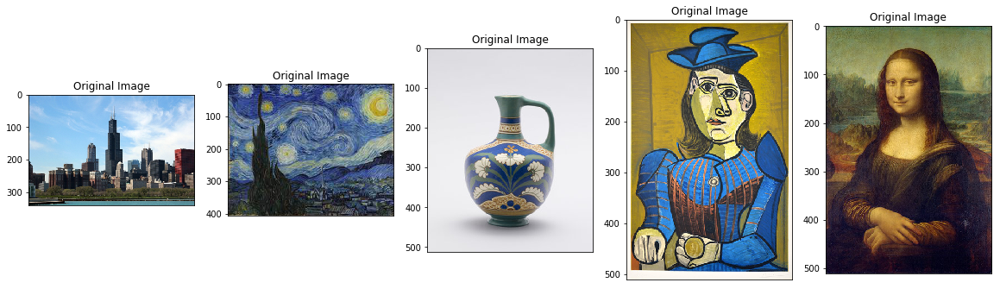

In [113]:
#Display all images selected as per the evaluation metrics as the auto-styling results
  
def image_display_mod(img, title=None):
    img_out = np.squeeze(img, axis=0)
    img_out = img_out.astype('uint8')
    plt.imshow(img_out)
    if title is not None:
      plt.title(title)
    plt.imshow(img_out)
    plt.tick_params(axis='both',which='both',bottom=False,top=False,labelbottom=False)
  
top_images = list(all_eval_scores.loc[all_eval_scores['final_rank'] == 1.0, 'Output_NST_images'])
content_images = list(all_eval_scores.loc[all_eval_scores['final_rank'] == 1.0, 'original_images'])

print (content_images)
print (top_images)

plt.figure(figsize=(20,10))
for i in range(len(content_images)):
    img = image_loading(content_images[i])
    plt.subplot(1,5,i+1)
    image_display_mod(img, "Original Image")

<Figure size 1440x720 with 0 Axes>

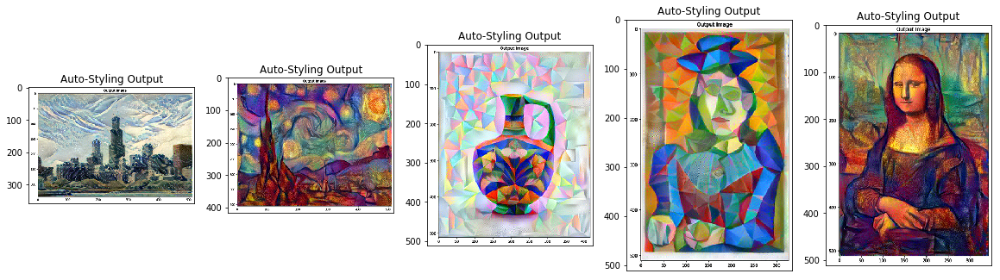

In [114]:
plt.figure(figsize=(20,10))
for i in range(len(content_images)):
    img = image_loading(top_images[i])
    plt.subplot(1,5,i+1)
    image_display_mod(img, "Auto-Styling Output")